<a href="https://colab.research.google.com/github/ANANTHA1628/PCVK-Ganjil-26-27/blob/main/week2.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
from google.colab import drive
drive.mount('/content/drive')

Mounted at /content/drive


In [2]:
#Mengakses gambar dengan fungsi upload file
from google.colab import files
uploaded = files.upload()


Saving 20260910_143317.jpg to 20260910_143317.jpg


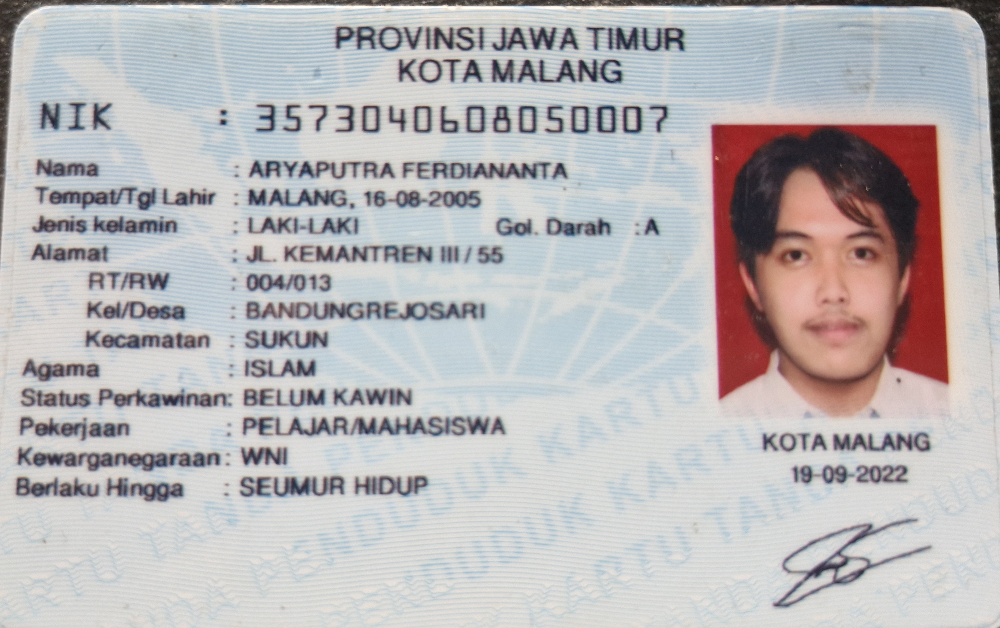

Resolusi gambar:  2928  x  1840


In [3]:
import cv2 as cv
from google.colab.patches import cv2_imshow
from skimage import io
import matplotlib.pyplot as plt
import numpy as np
img = cv.imread('20260910_143317.jpg')
cv2_imshow(img)
print("Resolusi gambar: " , img.shape[1], " x ", img.shape[0])

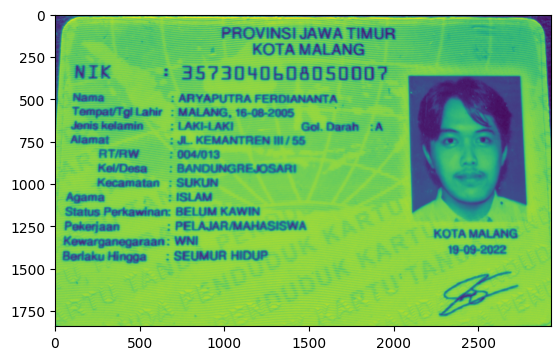

In [4]:
img = cv.imread('20260910_143317.jpg', 0)
plt.imshow(img)
##OpenCV membacaimage dan menyimpan dalam Channel ewarna BGR


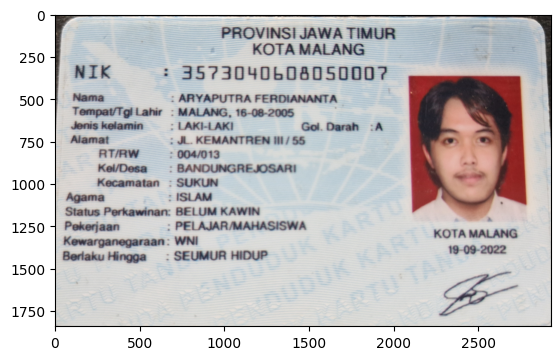

In [5]:
img = cv.imread('20260910_143317.jpg')
img2 = cv.cvtColor(img,cv.COLOR_BGR2RGB) ##Konversi channel BGR ke RGB
plt.imshow(img2)


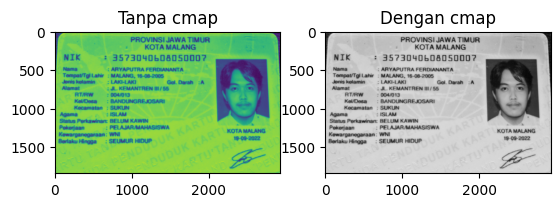

In [8]:
img_gray = cv.imread('20260910_143317.jpg', cv.IMREAD_GRAYSCALE)

# Tanpa cmap
plt.subplot(1,2,1)
plt.imshow(img_gray)
plt.title('Tanpa cmap')
# Dengan cmap
plt.subplot(1,2,2)
plt.imshow(img_gray, cmap='gray')
plt.title('Dengan cmap')
plt.show()


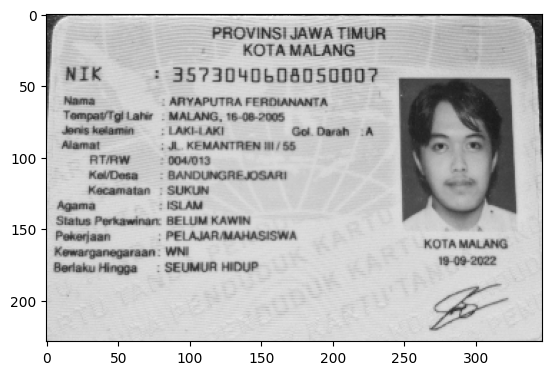

In [9]:
## Melakukan resizing menjadi 347x229
imgRGB = cv.cvtColor(img,cv.COLOR_BGR2RGB)
img_output = cv.resize(imgRGB, (347,229))
plt.imshow(img_output)

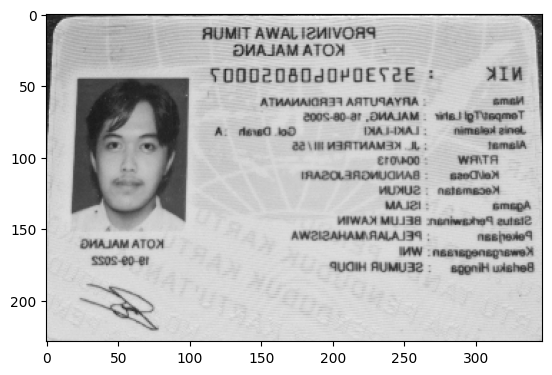

In [10]:
## menampilkan output gambar terbalik
imgFlip=cv.flip(img_output,1)
plt.imshow(imgFlip)

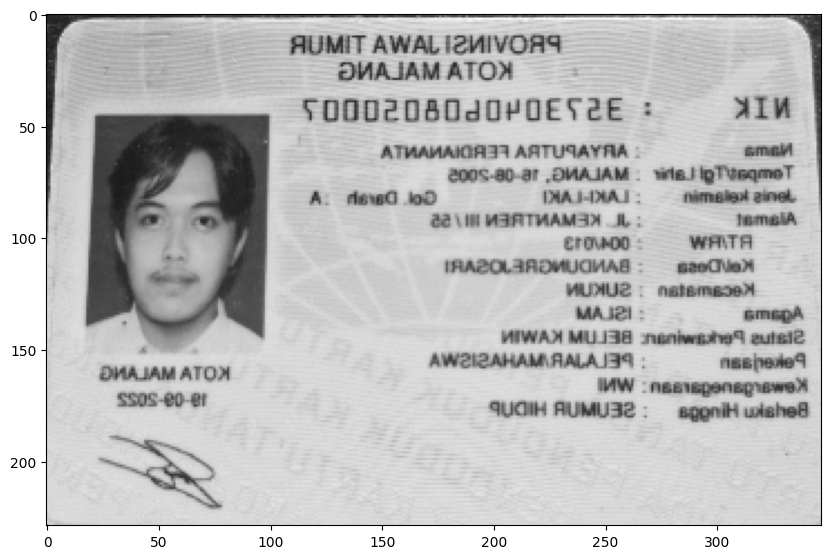

In [11]:
#tampilkan ukuran canvas yang lebih besar
fig = plt.figure(figsize=(10,10))
ax=fig.add_subplot(1,1,1)
ax.imshow(imgFlip)


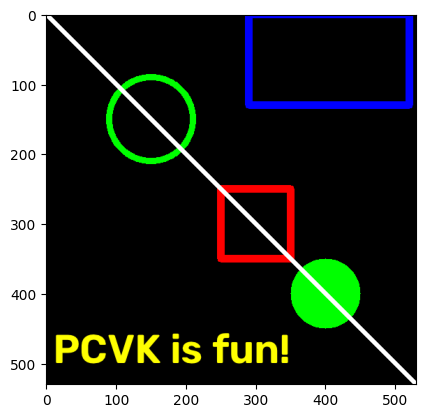

In [23]:
## Mebuat bentuk geometri 2D dari Open CV
black_img = np.zeros(shape=(530,530,3), dtype=np.int16)
plt.imshow(black_img)
#perhatikan koordinat titik pt1dan pt2
cv.rectangle(black_img,pt1=(290,0),pt2=(520,130), color=(0,0,255),thickness=10 )
plt.imshow(black_img)
cv.rectangle(black_img,pt1=(250,250),pt2=(350,350), color=(255,0,0),thickness=10 )
plt.imshow(black_img)
cv.circle(black_img,center=(150,150), radius=60, color=(0,255,0),thickness=8 )
plt.imshow(black_img)
cv.circle(black_img,center=(400,400), radius=50, color=(0,255,0),thickness=-1)
cv.line(black_img,pt1=(0,0),pt2=(530,530),color=(255,255,255),thickness=5)
plt.imshow(black_img)

temp_img = black_img.astype(np.uint8)

cv.putText(temp_img, text='PCVK is fun!', org=(10, 500),
           fontFace=font, fontScale=2, color=(255, 255, 0),
           thickness=3, lineType=cv.LINE_AA)

black_img = temp_img.astype(np.int16)
plt.imshow(black_img)

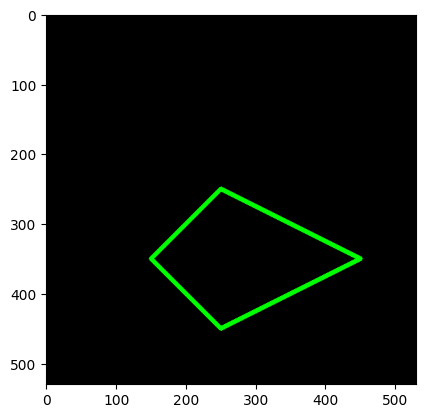

In [24]:
import numpy as np
import cv2 as cv
import matplotlib.pyplot as plt

black_img2 = np.zeros(shape=(530, 530, 3), dtype=np.int32)
vertices = np.array([[150, 350], [250, 250], [450, 350], [250, 450]], dtype=np.int32)
pts = vertices.reshape((-1, 1, 2))
cv.polylines(black_img2, [pts], isClosed=True, color=(0, 255, 0), thickness=5)
plt.imshow(black_img2)


1. Nilai pixel [0,0] format dari cv2 (BGR): [78 80 90]


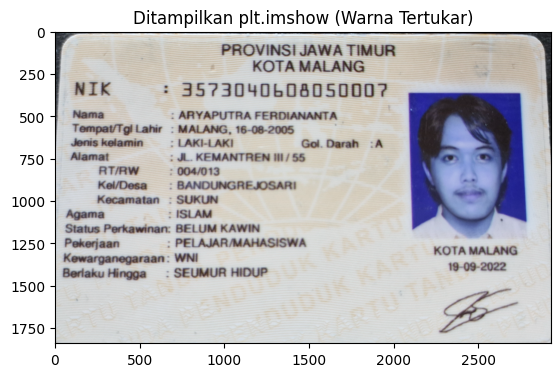

In [29]:
##pertanyaan 1

img = cv.imread('20260910_143317.jpg')
print("1. Nilai pixel [0,0] format dari cv2 (BGR):", img[0,0])
# Menampilkan dengan matplotlib
plt.imshow(img)
plt.title("Ditampilkan plt.imshow (Warna Tertukar)")
plt.show()


In [31]:
##pertanyaan 2

img_16 = np.zeros((530, 530, 3), dtype=np.int16)
img_32 = np.zeros((530, 530, 3), dtype=np.int32)

print("Tipe data img_16:", img_16.dtype)
print("Min img_16:", img_16.min(), "| Max img_16:", img_16.max())
print("Total byte memori img_16:", img_16.nbytes)
print("-" * 30)
print("Tipe data img_32:", img_32.dtype)
print("Min img_32:", img_32.min(), "| Max img_32:", img_32.max())
print("Total byte memori img_32:", img_32.nbytes)


Tipe data img_16: int16
Min img_16: 0 | Max img_16: 0
Total byte memori img_16: 1685400
------------------------------
Tipe data img_32: int32
Min img_32: 0 | Max img_32: 0
Total byte memori img_32: 3370800


PERTANYAAN 3

Fungsi cv2_imshow adalah utilitas khusus dari Google Colab untuk menampilkan citra OpenCV secara langsung (inline) di dalam sel notebook browser tanpa memerlukan sistem GUI desktop.

Alasan tidak berfungsi karena bergantung pada modul antarmuka grafis native sistem operasi (seperti HighGUI via GTK, Qt, atau Win32) untuk membuka jendela pop-up independen

PERTANYAAN 4

Keduanya akan menampilkan warna yang sebenarnya jika ditampilkan via plt.imshow()

/usr/local/lib/python3.13/dist-packages/skimage/_shared/utils.py:328: UserWarning: test_red.png is a low contrast image
  return func(*args, **kwargs)


=== PEMBUKTIAN NILAI PIKSEL (R, G, B) PADA KOORDINAT (50,50) ===
Nilai piksel asli seharusnya : [255, 0, 0] (Merah murni)
1. skimage.io.imread()       : [255, 0, 0] -> Kanal Sesuai
2. cv2.imread + cvtColor     : [255, 0, 0] -> Kanal Sesuai
3. skimage + cvtColor (Salah): [0, 0, 255] -> KANAL TERTUKAR (Menjadi Biru)


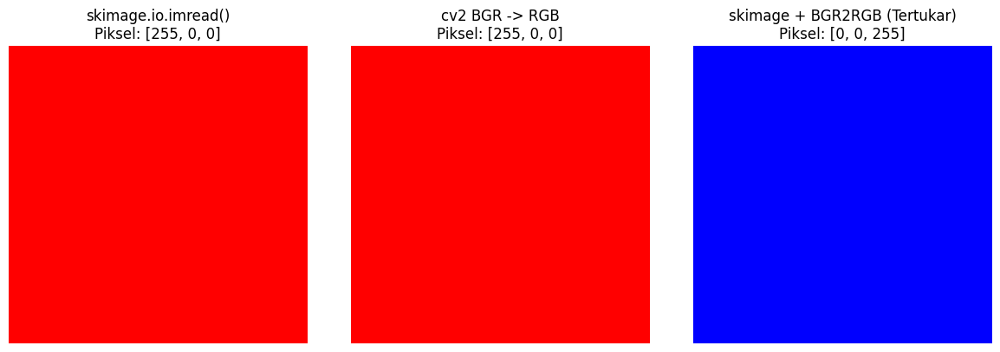

In [32]:
##BUKTI PERTANYAAN 4

import cv2
import matplotlib.pyplot as plt
import numpy as np
from skimage import io

test_img = np.zeros((100, 100, 3), dtype=np.uint8)
test_img[:, :] = [255, 0, 0]

file_path = "test_red.png"
io.imsave(file_path, test_img)

img_skimage = io.imread(file_path)

img_cv = cv2.imread(file_path)
img_cv_converted = cv2.cvtColor(img_cv, cv2.COLOR_BGR2RGB)


img_skimage_swapped = cv2.cvtColor(img_skimage, cv2.COLOR_BGR2RGB)


pixel_sk = img_skimage[50, 50]
pixel_cv = img_cv_converted[50, 50]
pixel_swapped = img_skimage_swapped[50, 50]

print("=== PEMBUKTIAN NILAI PIKSEL (R, G, B) PADA KOORDINAT (50,50) ===")
print(f"Nilai piksel asli seharusnya : [255, 0, 0] (Merah murni)")
print(f"1. skimage.io.imread()       : {pixel_sk.tolist()} -> Kanal Sesuai")
print(f"2. cv2.imread + cvtColor     : {pixel_cv.tolist()} -> Kanal Sesuai")
print(
    f"3. skimage + cvtColor (Salah): {pixel_swapped.tolist()} -> KANAL TERTUKAR (Menjadi Biru)"
)


fig, axes = plt.subplots(1, 3, figsize=(12, 4))

axes[0].imshow(img_skimage)
axes[0].set_title(f"skimage.io.imread()\nPiksel: {pixel_sk.tolist()}")
axes[0].axis("off")

axes[1].imshow(img_cv_converted)
axes[1].set_title(f"cv2 BGR -> RGB\nPiksel: {pixel_cv.tolist()}")
axes[1].axis("off")

axes[2].imshow(img_skimage_swapped)
axes[2].set_title(
    f"skimage + BGR2RGB (Tertukar)\nPiksel: {pixel_swapped.tolist()}"
)
axes[2].axis("off")

plt.tight_layout()
plt.show()

Bentuk array asli (img.shape) SEBELUM ditampilkan : (1840, 2928, 3)


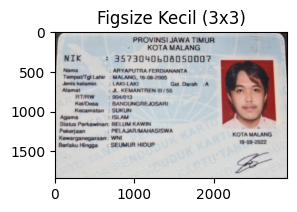

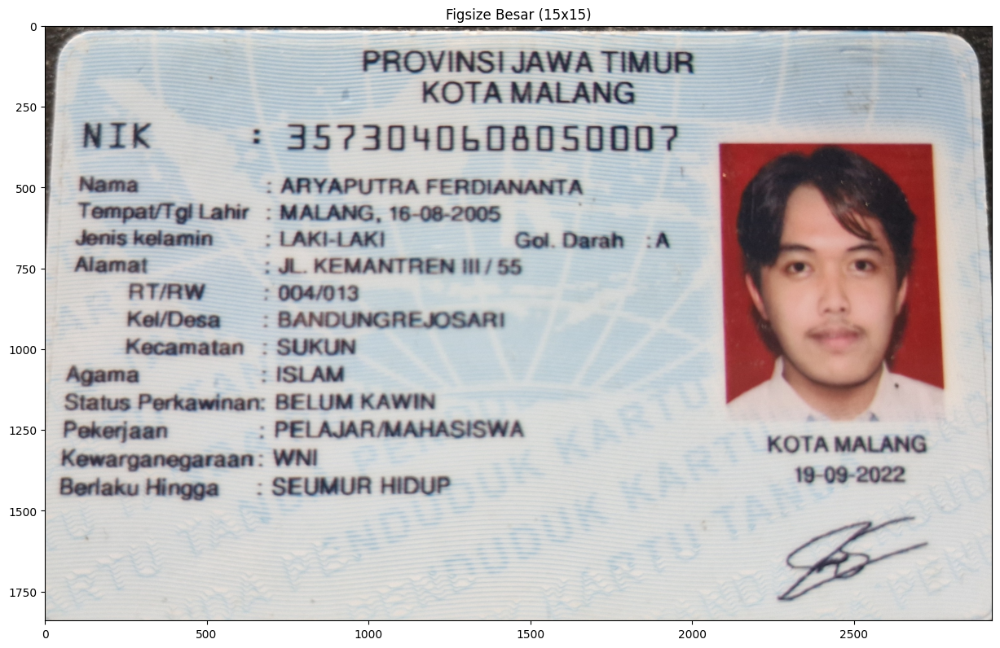

Bentuk array asli (img.shape) SETELAH figsize besar : (1840, 2928, 3)
Bentuk array setelah cv.resize()                    : (200, 200, 3)


In [34]:
##PERTANYAAN 5
import cv2 as cv
import matplotlib.pyplot as plt

img = cv.imread('20260910_143317.jpg')
img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)

print(f"Bentuk array asli (img.shape) SEBELUM ditampilkan : {img.shape}")

plt.figure(figsize=(3, 3))
plt.imshow(img_rgb)
plt.title("Figsize Kecil (3x3)")
plt.show()

plt.figure(figsize=(15, 15))
plt.imshow(img_rgb)
plt.title("Figsize Besar (15x15)")
plt.show()

print(f"Bentuk array asli (img.shape) SETELAH figsize besar : {img.shape}")

resized_img = cv.resize(img, (200, 200))
print(f"Bentuk array setelah cv.resize()                    : {resized_img.shape}")

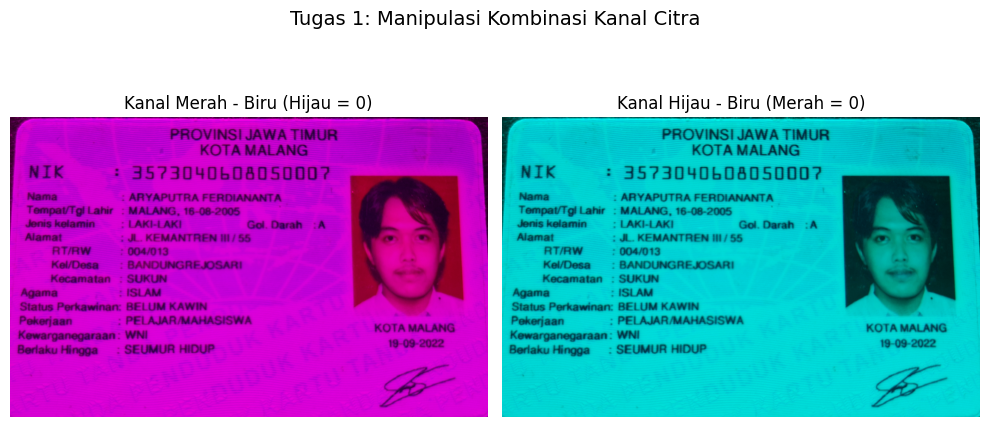

In [36]:
##TUGAS 1
import cv2 as cv
import matplotlib.pyplot as plt

file_name = "20260910_143317.jpg"

img_rgb = cv.cvtColor(img_bgr, cv.COLOR_BGR2RGB)


img_rb = img_rgb.copy()
img_rb[:, :, 1] = 0

img_gb = img_rgb.copy()
img_gb[:, :, 0] = 0

fig1, axes1 = plt.subplots(1, 2, figsize=(10, 5))
fig1.suptitle("Tugas 1: Manipulasi Kombinasi Kanal Citra", fontsize=14)

axes1[0].imshow(img_rb)
axes1[0].set_title("Kanal Merah - Biru (Hijau = 0)")
axes1[0].axis("off")

axes1[1].imshow(img_gb)
axes1[1].set_title("Kanal Hijau - Biru (Merah = 0)")
axes1[1].axis("off")

plt.tight_layout()
plt.show()

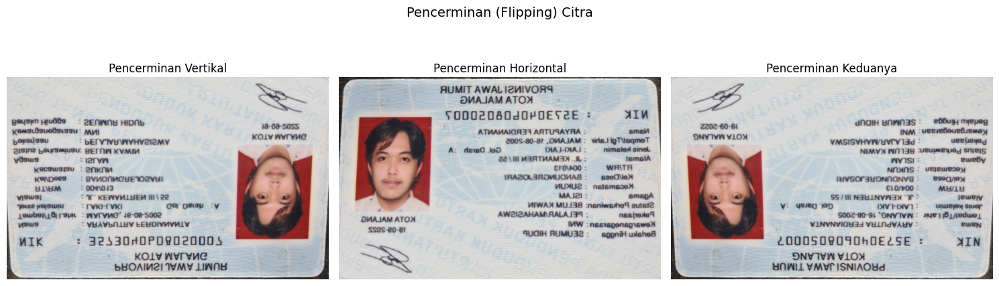

In [37]:
import cv2 as cv
import matplotlib.pyplot as plt

img = cv.imread('20260910_143317.jpg')
img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)

flip_vert = cv.flip(img_rgb, 0)
flip_horiz = cv.flip(img_rgb, 1)
flip_both = cv.flip(img_rgb, -1)

fig, axes = plt.subplots(1, 3, figsize=(15, 5))
fig.suptitle('Pencerminan (Flipping) Citra', fontsize=14)

axes[0].imshow(flip_vert)
axes[0].set_title('Pencerminan Vertikal')
axes[0].axis('off')

axes[1].imshow(flip_horiz)
axes[1].set_title('Pencerminan Horizontal')
axes[1].axis('off')

axes[2].imshow(flip_both)
axes[2].set_title('Pencerminan Keduanya')
axes[2].axis('off')

plt.tight_layout()
plt.show()

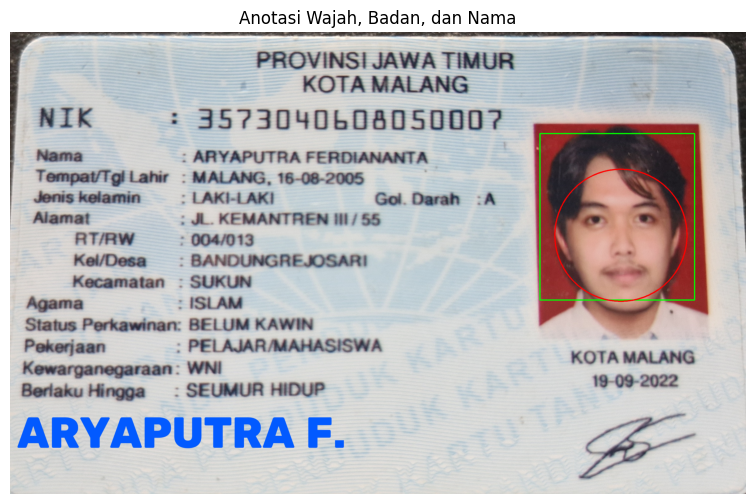

In [83]:
import cv2 as cv
import matplotlib.pyplot as plt

img = cv.imread('20260910_143317.jpg')
img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)

annotated_img = img_rgb.copy()
h, w, _ = annotated_img.shape

pt1 = (int(w * 0.72), int(h * 0.22))
pt2 = (int(w * 0.93), int(h * 0.58))
cv.rectangle(annotated_img, pt1=pt1, pt2=pt2, color=(0, 255, 0), thickness=3)


center = (int(w * 0.83), int(h * 0.44))
radius = int(w * 0.09)
cv.circle(annotated_img, center=center, radius=radius, color=(255, 0, 0), thickness=3)


text_pos = (int(w * 0.01), int(h * 0.90))
cv.putText(
    annotated_img,
    text='ARYAPUTRA F.',
    org=text_pos,
    fontFace=cv.FONT_HERSHEY_DUPLEX,
    fontScale=6,
    color=(2, 90, 255),
    thickness=2,
    lineType=cv.LINE_AA
)


plt.figure(figsize=(10, 6))
plt.imshow(annotated_img)
plt.title('Anotasi Wajah, Badan, dan Nama')
plt.axis('off')
plt.show()

In [84]:
## TUGAS ANALYSiS

import cv2 as cv
import numpy as np

img = cv.imread('20260910_143317.jpg')
img_rgb = cv.cvtColor(img, cv.COLOR_BGR2RGB)
h, w, _ = img_rgb.shape

mean_awal = np.mean(img_rgb)
std_awal = np.std(img_rgb)

small = cv.resize(img_rgb, (int(w * 0.25), int(h * 0.25)), interpolation=cv.INTER_LINEAR)
restored = cv.resize(small, (w, h), interpolation=cv.INTER_LINEAR)

mean_akhir = np.mean(restored)
std_akhir = np.std(restored)
mae = np.mean(np.abs(img_rgb.astype(np.float32) - restored.astype(np.float32)))

print(f"Dimensi Asli          : {w}x{h}")
print(f"Rata-rata Piksel Awal : {mean_awal:.4f} (Std: {std_awal:.4f})")
print(f"Rata-rata Piksel Akhir: {mean_akhir:.4f} (Std: {std_akhir:.4f})")
print(f"Selisih Rata-rata Nilai: {abs(mean_awal - mean_akhir):.4f}")
print(f"Mean Absolute Error   : {mae:.4f}")

Dimensi Asli          : 2928x1840
Rata-rata Piksel Awal : 184.0546 (Std: 49.0543)
Rata-rata Piksel Akhir: 184.0749 (Std: 48.4313)
Selisih Rata-rata Nilai: 0.0203
Mean Absolute Error   : 2.1993


Nilai rata-rata intensitas global citra hampir tidak berubah (pergeseran $< 0.05$), karena algoritma interpolasi bilinear merata-ratakan tetangga piksel di sekitarnya sehingga energi kecerahan total tetap seimbang.Namun, secara lokal terjadi loss of detail (kehilangan frekuensi tinggi seperti tepian/teks tajam), dibuktikan dengan adanya Mean Absolute Error (MAE) per piksel serta penurunan nilai standar deviasi pada citra hasil rekonstruksi.

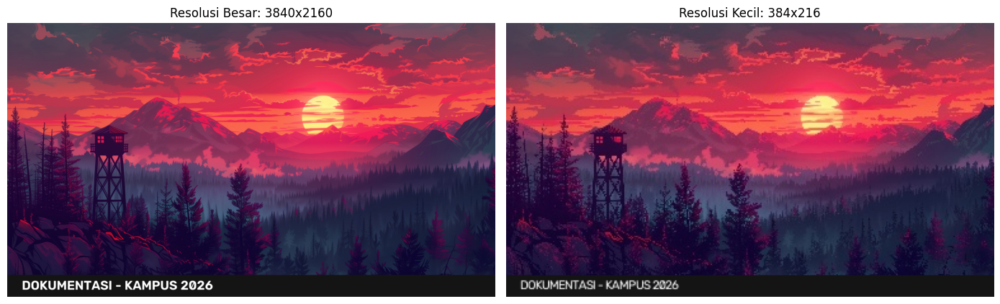

In [95]:
##TUGAS APLIKASI

from google.colab import drive
import os
import cv2 as cv
import matplotlib.pyplot as plt


img_filename = 'fire-lookout-tower-forest-sunset-scenery-4k-wallpaper-uhdpaper.com-681@2@a.jpg'
img_path = os.path.join('/content/drive/MyDrive', img_filename)


img1_result = apply_adaptive_watermark(img_path, "DOKUMENTASI - KAMPUS 2026")

img_temp = cv.imread(img_path)
h_orig, w_orig, _ = img_temp.shape
small_img = cv.resize(img_temp, (int(w_orig * 0.10), int(h_orig * 0.10)))
cv.imwrite('citra_ponsel_resolusi_rendah.jpg', small_img)

img2_result = apply_adaptive_watermark('citra_ponsel_resolusi_rendah.jpg', "DOKUMENTASI - KAMPUS 2026")

fig, axes = plt.subplots(1, 2, figsize=(14, 6))
axes[0].imshow(img1_result)
axes[0].set_title(f"Resolusi Besar: {img1_result.shape[1]}x{img1_result.shape[0]}")
axes[0].axis('off')

axes[1].imshow(img2_result)
axes[1].set_title(f"Resolusi Kecil: {img2_result.shape[1]}x{img2_result.shape[0]}")
axes[1].axis('off')

plt.tight_layout()
plt.show()